In [4]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import warnings; warnings.filterwarnings(action='once')

In [5]:
df_2022 = pd.read_html('https://fbref.com/en/comps/9/2022-2023/stats/2022-2023-Premier-League-Stats')
df_2023 = pd.read_html('https://fbref.com/en/comps/9/2023-2024/stats/2023-2024-Premier-League-Stats')
df_2024 = pd.read_html('https://fbref.com/en/comps/9/stats/Premier-League-Stats')

In [12]:
pd.set_option('display.max_column', 10)
pd.set_option('display.width', 10)

# xG and Goals Difference

### Function

In [115]:
def preprocess_xg(df):
    df = pd.DataFrame(df[0])
    df.columns = df.columns.droplevel()
    df = df.iloc[:,0:22]
    df['G-xG'] = df.Gls-df.xG
    df = df.sort_values('G-xG',ascending=True).reset_index(drop=True)
    return df


def line_chart(df):
    return df.plot.line(x='Squad',y=['xG','Gls'])

def bar_chart_h(df):
    return df.plot.barh(x='Squad',y=['Gls','xG'],color={"Gls":"Red","xG":"Blue"})

def visualization_xg(df,green_start,green_width,red_width, season):
    df = df.sort_values('G-xG',ascending=True).reset_index(drop=True)
    viz_dat = df[['Squad','xG','Gls','G-xG']]
    # Draw plot
    import matplotlib.patches as patches

    fig, ax = plt.subplots(figsize=(25,15), facecolor='white', dpi= 300)

    x=viz_dat.index
    w = 0.3
    ax.vlines(x=x, ymin=0, ymax=viz_dat.Gls, color='seagreen', alpha=0.7, linewidth=20,label="Goals")
    ax.vlines(x=x-w, ymin=0, ymax=viz_dat.xG, color='darkblue', alpha=0.7, linewidth=20,label="xG")
    #ax.bar(x-w,viz_dat.xG,width=w,color='green',align='center')
    #ax.bar(x,viz_dat.Gls,width=w,color='firebrick',align='center')
    ax.legend(loc="upper left",fontsize="20")

    # Annotate Text
    for i, a in enumerate(viz_dat.Gls):
        if a>viz_dat['xG'][i]:
            ax.text(i-0.2, a+3.5, round(viz_dat['G-xG'][i],1), horizontalalignment='center', fontdict={'size':14,'fontweight':'bold','color':'green'})
            ax.text(i-0.2, a+0.9, (viz_dat['xG'][i],viz_dat['Gls'][i]), horizontalalignment='center',fontdict={'size':11,'fontweight':'bold'})
        else:
            ax.text(i-0.2, viz_dat['xG'][i]+3.5, round(viz_dat['G-xG'][i],1), horizontalalignment='center',fontdict={'size':14,'fontweight':'bold','color':'red'})
            ax.text(i-0.2, viz_dat['xG'][i]+0.9, (viz_dat['xG'][i],viz_dat['Gls'][i]), horizontalalignment='center',fontdict={'size':11,'fontweight':'bold'})

    # Title, Label, Ticks and Ylim
    ax.set_title(f'xG and Goals Difference Premier League Season {season}', fontdict={'size':30})
    ax.set(ylim=(0,110))
    ax.set_ylabel('xG or Goals',fontsize=14,fontweight='bold')
    plt.xticks(viz_dat.index, viz_dat.Squad, rotation=40, horizontalalignment='right', fontsize=12,fontweight='bold')
    ax.text(-.03, -.17, 'Data: FBRef (https://fbref.com/en/)', ha='left', va='bottom', transform=ax.transAxes,fontdict={'size':14,'fontweight':'bold','color':'black'})
    ax.text(.99, -.17, 'Twitter:@unitedbuff', ha='right', va='bottom', transform=ax.transAxes,fontdict={'size':14,'fontweight':'bold','color':'black'})
    # Add patches to color the X axis labels
    p1 = patches.Rectangle((green_start, 0.01), width=green_width, height=.10, alpha=.15, facecolor='green', transform=fig.transFigure)
    p2 = patches.Rectangle((.124, 0.01), width=red_width, height=.10, alpha=.15, facecolor='red', transform=fig.transFigure)
    fig.add_artist(p1)
    fig.add_artist(p2)
    #plt.grid()
    plt.show()

### Prem 2022

In [112]:
df_dat_22 = preprocess_xg(df_2022)
df_dat_22

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,G-xG
0,Everton,28,26.6,42.8,38,418,3420,38.0,32,24,...,3,81,2,45.2,42.8,32.4,75.1,500,1052,-13.2
1,Chelsea,32,26.3,58.7,38,418,3420,38.0,37,27,...,3,81,3,49.5,47.2,38.6,85.8,829,1737,-12.5
2,Manchester Utd,26,26.9,53.7,38,418,3420,38.0,56,42,...,3,78,2,67.7,65.3,52.2,117.5,711,1595,-11.7
3,Wolves,32,26.7,49.9,38,418,3420,38.0,28,12,...,3,85,6,36.8,34.5,25.4,60.0,610,1343,-8.8
4,West Ham,25,28.2,42.1,38,418,3420,38.0,41,25,...,8,44,0,49.2,43.7,32.7,76.4,615,1274,-8.2
5,Newcastle Utd,27,27.3,52.3,38,418,3420,38.0,64,42,...,6,61,1,71.9,67.3,51.8,119.1,695,1618,-7.9
6,Brighton,29,26.3,60.2,38,418,3420,38.0,68,46,...,6,58,0,73.3,68.9,52.2,121.2,809,1849,-5.3
7,Nott'ham Forest,33,26.5,37.6,38,418,3420,38.0,36,22,...,6,84,0,39.3,34.6,26.3,61.0,436,859,-3.3
8,Leeds United,29,25.3,47.0,38,418,3420,38.0,45,31,...,3,89,3,47.3,44.9,31.8,76.7,555,1429,-2.3
9,Southampton,36,24.7,44.5,38,418,3420,38.0,36,25,...,4,73,0,37.8,34.6,28.1,62.7,588,1125,-1.8


<Axes: xlabel='Squad'>

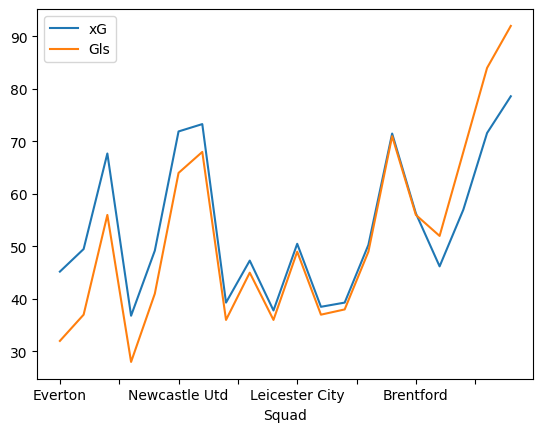

In [113]:
line_chart(df_dat_22)

<Axes: ylabel='Squad'>

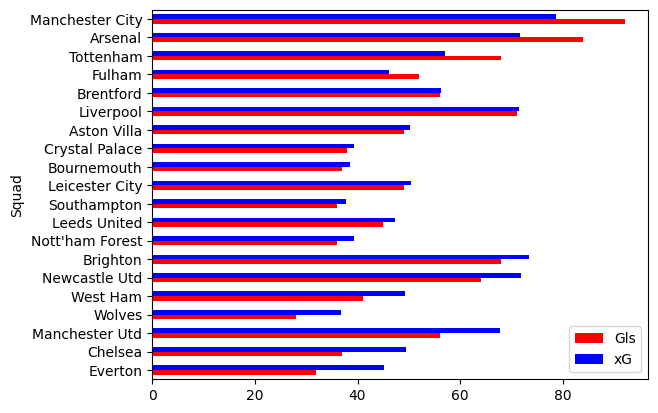

In [114]:
bar_chart_h(df_dat_22)

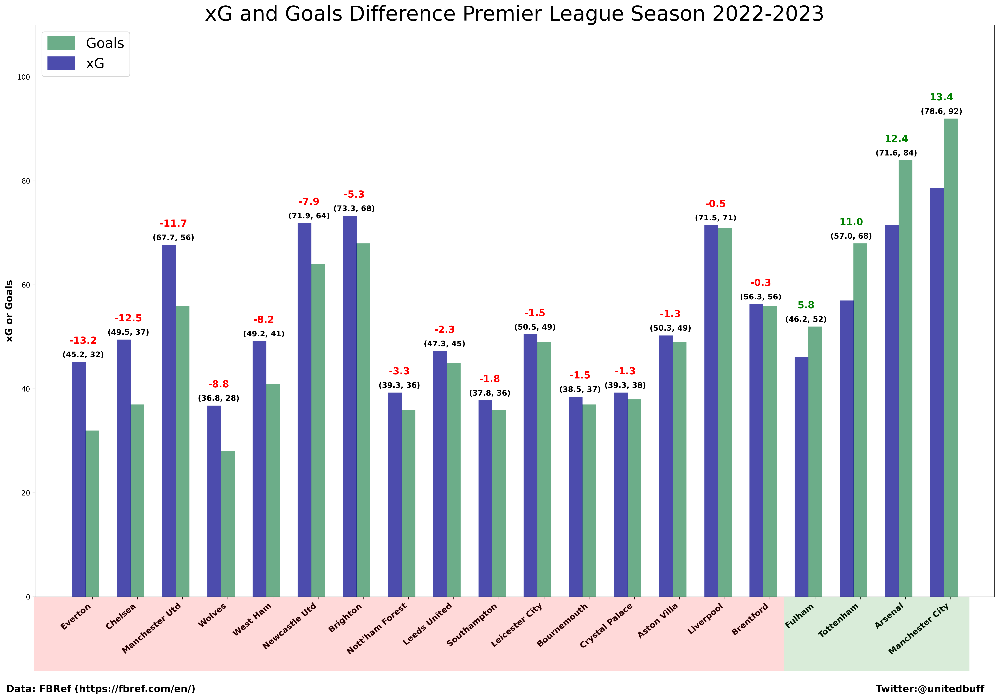

In [93]:
green_start = .73
green_width = .15
red_width = .606
season = "2022-2023"
visualization_xg(df_dat_22,green_start,green_width,red_width, season)

### Prem 2023

In [94]:
df_dat_23 = preprocess_xg(df_2023)
df_dat_23

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,G-xG
0,Everton,26,27.1,40.8,38,418,3420,38.0,40,17,...,3,82,1,54.0,51.6,38.1,89.8,495,1129,-14.0
1,Liverpool,30,26.3,61.3,38,418,3420,38.0,80,60,...,9,69,5,87.8,80.4,63.7,144.1,924,2110,-7.8
2,Sheffield Utd,35,25.7,35.8,38,418,3420,38.0,31,18,...,5,101,5,38.3,34.5,25.8,60.3,346,884,-7.3
3,Brighton,30,25.9,59.8,38,418,3420,38.0,50,36,...,6,90,3,56.8,52.2,41.6,93.8,864,1780,-6.8
4,Brentford,28,26.6,45.2,38,418,3420,38.0,54,38,...,3,89,2,58.2,56.0,42.7,98.8,505,1283,-4.2
5,Bournemouth,30,25.7,44.4,38,418,3420,38.0,52,39,...,3,79,3,55.9,53.6,40.5,94.0,709,1314,-3.9
6,Nott'ham Forest,33,25.7,40.6,38,418,3420,38.0,49,43,...,1,82,3,49.9,49.1,37.9,87.0,601,1141,-0.9
7,Burnley,31,24.5,47.4,38,418,3420,38.0,40,30,...,3,77,7,40.6,38.3,29.7,68.0,727,1181,-0.6
8,Wolves,27,26.6,48.9,38,418,3420,38.0,47,36,...,4,102,4,46.7,43.6,31.8,75.4,671,1180,0.3
9,Manchester Utd,31,26.1,50.6,38,418,3420,38.0,57,36,...,7,83,1,56.5,51.0,40.1,91.0,758,1479,0.5


<Axes: xlabel='Squad'>

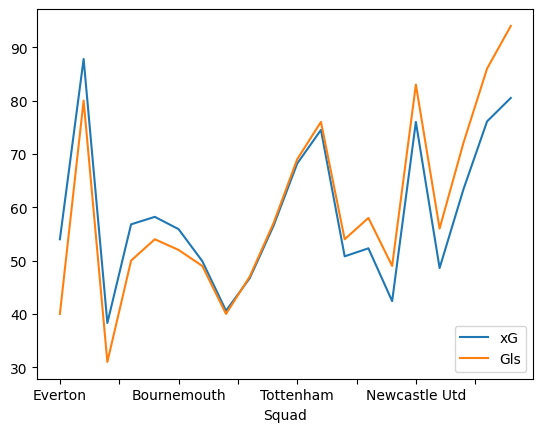

In [95]:
line_chart(df_dat_23)

<Axes: ylabel='Squad'>

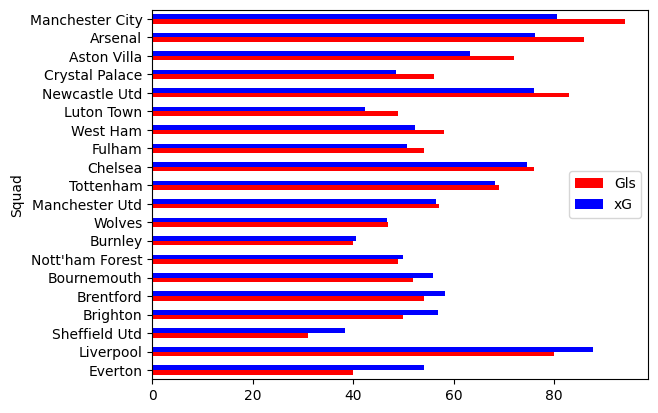

In [96]:
bar_chart_h(df_dat_23)

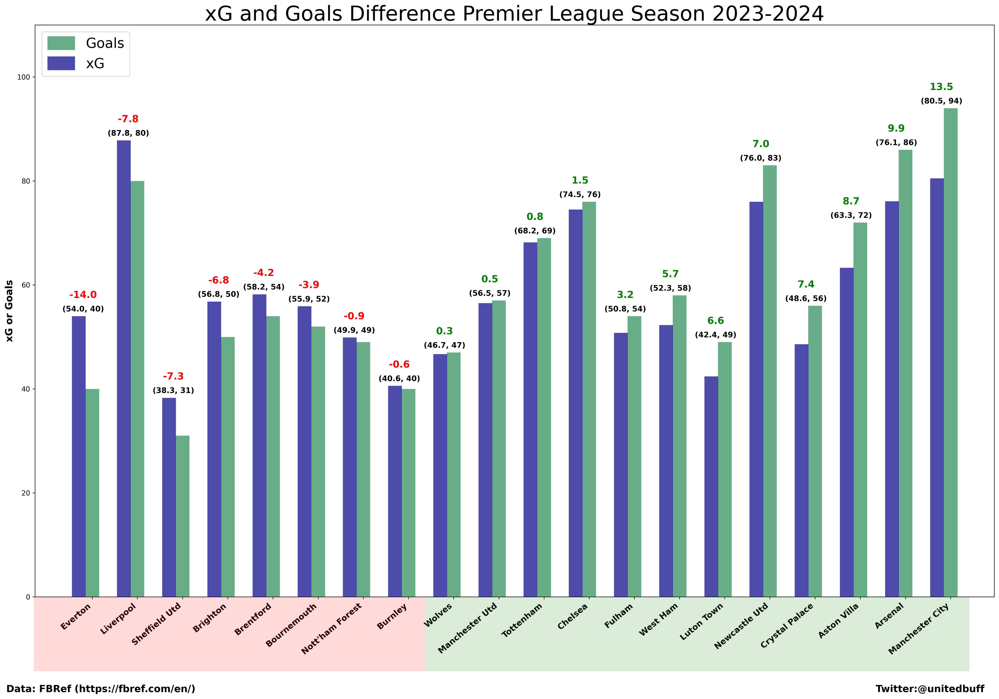

In [97]:
green_start = .44
green_width = .44
red_width = .316
season = "2023-2024"
visualization_xg(df_dat_23,green_start,green_width,red_width, season)

### Prem 2024

In [98]:
df_dat_24 = preprocess_xg(df_2024)
df_dat_24

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,G-xG
0,Crystal Palace,29,27.0,43.2,35,385,3150,35.0,42,32,...,4,78,4,53.6,50.5,39.9,90.4,463,1067,-11.6
1,Manchester Utd,31,26.2,53.2,35,385,3150,35.0,40,28,...,3,78,3,47.2,44.9,35.8,80.6,632,1297,-7.2
2,Southampton,35,26.1,49.4,35,385,3150,35.0,24,15,...,2,86,3,30.7,29.0,23.6,52.6,611,1067,-6.7
3,Bournemouth,29,25.8,47.7,35,385,3150,35.0,54,39,...,7,90,2,60.5,55.0,41.6,96.6,692,1356,-6.5
4,Chelsea,29,24.4,57.7,35,385,3150,35.0,59,45,...,5,96,1,65.2,61.3,50.4,111.7,811,1497,-6.2
5,West Ham,27,28.9,47.9,35,385,3150,35.0,37,24,...,3,74,3,43.1,40.8,31.2,72.0,573,1125,-6.1
6,Everton,26,28.7,40.9,35,385,3150,35.0,33,22,...,2,77,2,36.9,35.3,28.0,63.3,448,959,-3.9
7,Leicester City,31,27.4,45.5,35,385,3150,35.0,29,22,...,3,81,0,30.5,28.3,23.7,52.0,550,1013,-1.5
8,Aston Villa,28,27.8,51.0,35,385,3150,35.0,53,42,...,6,68,2,53.3,48.5,39.6,88.1,666,1237,-0.3
9,Brighton,31,25.7,52.3,35,385,3150,35.0,55,37,...,5,75,3,52.7,48.9,37.0,85.9,740,1404,2.3


<Axes: xlabel='Squad'>

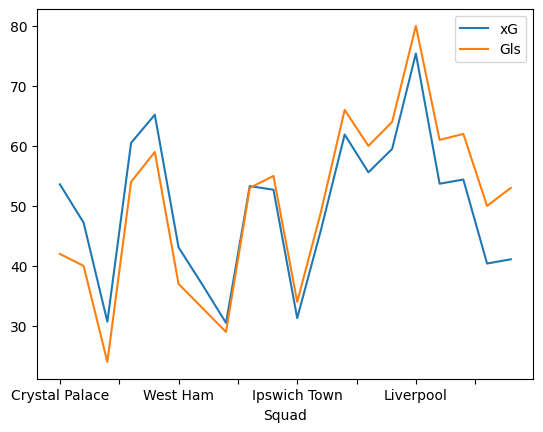

In [99]:
line_chart(df_dat_24)

<Axes: ylabel='Squad'>

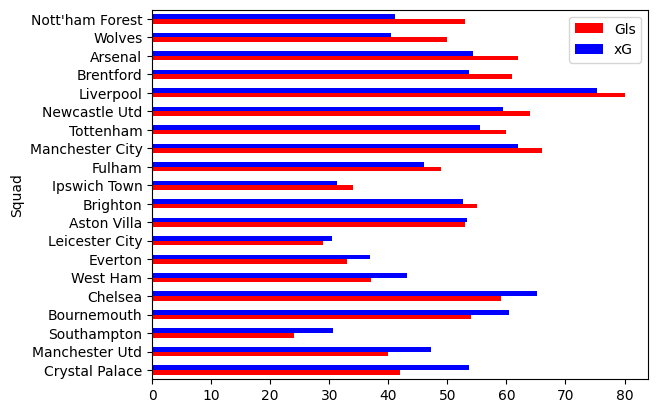

In [100]:
bar_chart_h(df_dat_24)

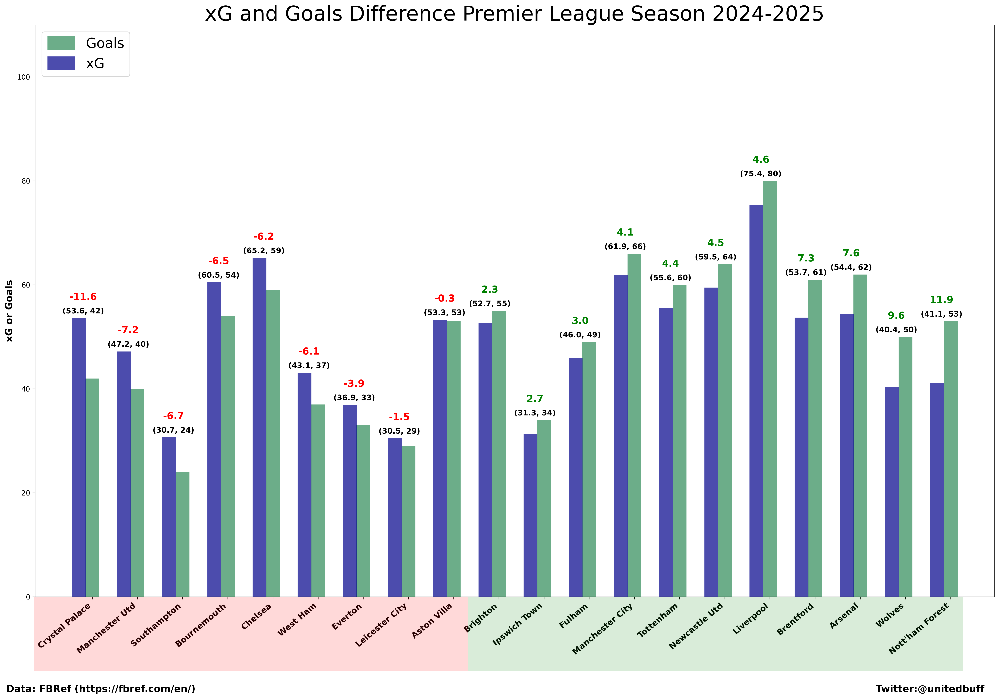

In [101]:
green_start = .475
green_width = .40
red_width = .351
season = "2024-2025"
visualization_xg(df_dat_24,green_start,green_width,red_width, season)

# xG Allowed and Goal Conceded

### Function

In [116]:
def preprocess_xga(df):
    df = pd.DataFrame(df[1])
    df.columns = df.columns.droplevel()
    df = df.iloc[:,0:22]
    df['xG-G'] = df.xG-df.Gls
    df = df.sort_values('xG-G',ascending=True).reset_index(drop=True)
    return df


def line_chart(df):
    return df.plot.line(x='Squad',y=['xG','Gls'])

def bar_chart_h(df):
    return df.plot.barh(x='Squad',y=['Gls','xG'],color={"Gls":"Red","xG":"Blue"})

def visualization(df,green_start,green_width,red_width, season):
    df = df.sort_values('xG-G',ascending=True).reset_index(drop=True)
    viz_dat = df[['Squad','xG','Gls','xG-G']]
    # Draw plot
    import matplotlib.patches as patches

    fig, ax = plt.subplots(figsize=(25,15), facecolor='white', dpi= 300)

    x=viz_dat.index
    w = 0.3
    ax.vlines(x=x, ymin=0, ymax=viz_dat.Gls, color='seagreen', alpha=0.7, linewidth=20,label="Goals Conceded")
    ax.vlines(x=x-w, ymin=0, ymax=viz_dat.xG, color='darkblue', alpha=0.7, linewidth=20,label="xG Allowed")
    #ax.bar(x-w,viz_dat.xG,width=w,color='green',align='center')
    #ax.bar(x,viz_dat.Gls,width=w,color='firebrick',align='center')
    ax.legend(loc="upper left",fontsize="20")

    # Annotate Text
    for i, a in enumerate(viz_dat.xG):
        if a>viz_dat['Gls'][i]:
            ax.text(i-0.2, a+3.5, round(viz_dat['xG-G'][i],1), horizontalalignment='center', fontdict={'size':14,'fontweight':'bold','color':'green'})
            ax.text(i-0.2, a+0.9, (viz_dat['xG'][i],viz_dat['Gls'][i]), horizontalalignment='center',fontdict={'size':11,'fontweight':'bold'})
        else:
            ax.text(i-0.2, viz_dat['Gls'][i]+3.5, round(viz_dat['xG-G'][i],1), horizontalalignment='center',fontdict={'size':14,'fontweight':'bold','color':'red'})
            ax.text(i-0.2, viz_dat['Gls'][i]+0.9, (viz_dat['xG'][i],viz_dat['Gls'][i]), horizontalalignment='center',fontdict={'size':11,'fontweight':'bold'})

    # Title, Label, Ticks and Ylim
    ax.set_title(f'xG Allowed and Goals Conceded Difference Premier League Season {season}', fontdict={'size':30})
    ax.set(ylim=(0,120))
    ax.set_ylabel('xGA x Goals Conceded',fontsize=14,fontweight='bold')
    plt.xticks(viz_dat.index, viz_dat.Squad, rotation=40, horizontalalignment='right', fontsize=12,fontweight='bold')
    ax.text(-.03, -.17, 'Data: FBRef (https://fbref.com/en/)', ha='left', va='bottom', transform=ax.transAxes,fontdict={'size':14,'fontweight':'bold','color':'black'})
    ax.text(.99, -.17, 'Twitter:@unitedbuff', ha='right', va='bottom', transform=ax.transAxes,fontdict={'size':14,'fontweight':'bold','color':'black'})
    # Add patches to color the X axis labels
    p1 = patches.Rectangle((green_start, 0.01), width=green_width, height=.10, alpha=.15, facecolor='green', transform=fig.transFigure)
    p2 = patches.Rectangle((.124, 0.01), width=red_width, height=.10, alpha=.15, facecolor='red', transform=fig.transFigure)
    fig.add_artist(p1)
    fig.add_artist(p2)
    #plt.grid()
    plt.show()

### Prem 2022

In [117]:
df_dat_22 = preprocess_xga(df_2022)
df_dat_22

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,xG-G
0,vs Tottenham,29,26.7,50.1,38,418,3420,38.0,62,45,...,4,79,2,49.6,46.5,36.3,82.8,685,1516,-12.4
1,vs Leeds United,29,26.7,53.1,38,418,3420,38.0,77,50,...,6,66,3,67.1,62.4,49.8,112.2,596,1469,-9.9
2,vs Southampton,36,26.7,55.6,38,418,3420,38.0,68,55,...,3,63,2,60.8,58.4,46.2,104.6,653,1735,-7.2
3,vs Bournemouth,31,26.6,59.9,38,418,3420,38.0,68,49,...,7,51,0,63.8,58.3,45.3,103.6,810,1988,-4.2
4,vs Nott'ham Forest,33,26.8,62.8,38,418,3420,38.0,68,45,...,9,65,0,64.2,57.5,45.0,102.5,813,1904,-3.8
5,vs West Ham,25,26.6,58.2,38,418,3420,38.0,54,42,...,6,54,0,53.0,48.4,39.8,88.2,805,1721,-1.0
6,vs Arsenal,26,26.7,40.1,38,418,3420,38.0,42,27,...,5,84,1,42.0,38.0,31.6,69.6,510,907,0.0
7,vs Manchester City,24,26.6,34.7,38,418,3420,38.0,32,21,...,3,80,2,32.1,29.8,23.8,53.5,434,860,0.1
8,vs Leicester City,28,26.6,52.4,38,418,3420,38.0,63,46,...,5,64,2,63.3,59.8,47.9,107.7,721,1575,0.3
9,vs Crystal Palace,26,26.6,53.9,38,418,3420,38.0,46,32,...,4,83,3,48.1,44.9,34.5,79.4,590,1592,2.1


<Axes: xlabel='Squad'>

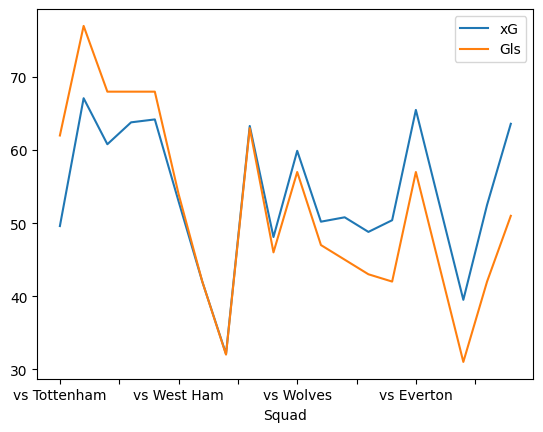

In [118]:
line_chart(df_dat_22)

<Axes: ylabel='Squad'>

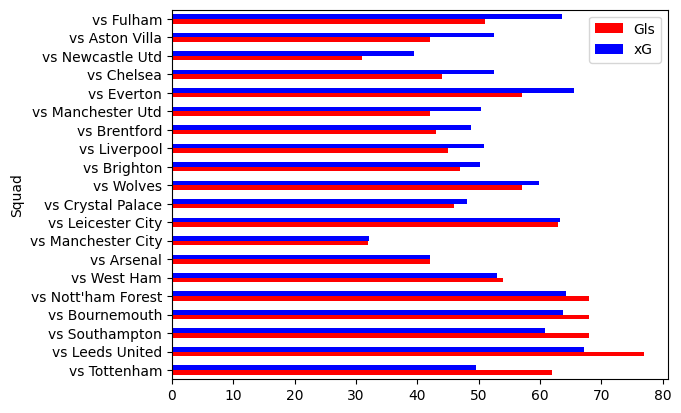

In [119]:
bar_chart_h(df_dat_22)

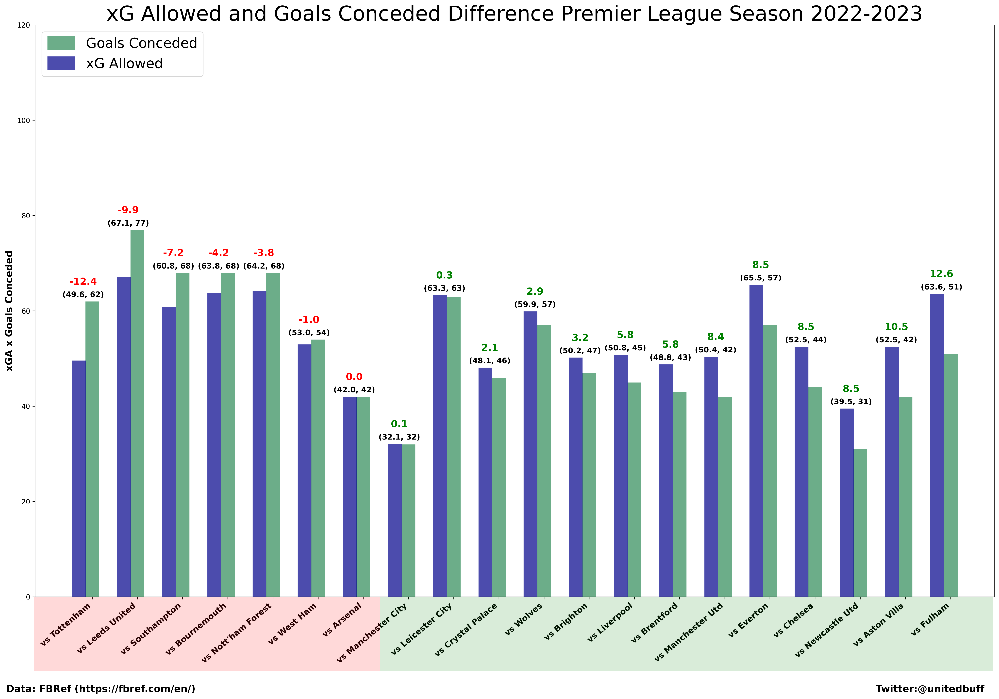

In [120]:
green_start = .404
green_width = .495
red_width = .280
season = "2022-2023"
visualization(df_dat_22, green_start, green_width, red_width, season)

### Prem 2023

In [121]:
df_dat_23 = preprocess_xga(df_2023)
df_dat_23

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,xG-G
0,vs Sheffield Utd,35,26.4,64.2,38,418,3420,38.0,97,75,...,7,53,2,76.6,71.2,57.0,128.2,964,1975,-20.4
1,vs Nott'ham Forest,33,26.4,59.4,38,418,3420,38.0,65,48,...,4,81,7,53.3,50.1,37.1,87.2,815,1901,-11.7
2,vs Brentford,28,26.1,54.8,38,418,3420,38.0,65,50,...,2,75,4,56.0,54.4,43.6,98.0,847,1585,-9.0
3,vs Bournemouth,30,26.2,55.6,38,418,3420,38.0,66,44,...,7,82,2,58.1,52.5,39.9,92.4,720,1500,-7.9
4,vs Brighton,30,26.3,40.2,38,418,3420,38.0,60,42,...,6,99,5,55.4,50.7,39.3,90.0,651,1175,-4.6
5,vs Burnley,31,26.3,52.6,38,418,3420,38.0,75,54,...,7,84,3,70.4,64.9,52.0,116.9,711,1501,-4.6
6,vs Crystal Palace,26,26.3,57.7,38,418,3420,38.0,56,46,...,3,78,2,52.0,49.6,40.3,89.9,679,1713,-4.0
7,vs Luton Town,28,26.5,57.6,38,418,3420,38.0,81,57,...,4,73,2,78.0,74.9,56.8,131.7,723,1495,-3.0
8,vs Chelsea,32,26.3,41.4,38,418,3420,38.0,60,43,...,5,100,4,58.1,54.1,42.0,96.1,727,1368,-1.9
9,vs Arsenal,25,26.3,41.8,38,418,3420,38.0,28,20,...,3,82,2,27.9,25.7,19.9,45.6,534,938,-0.1


<Axes: xlabel='Squad'>

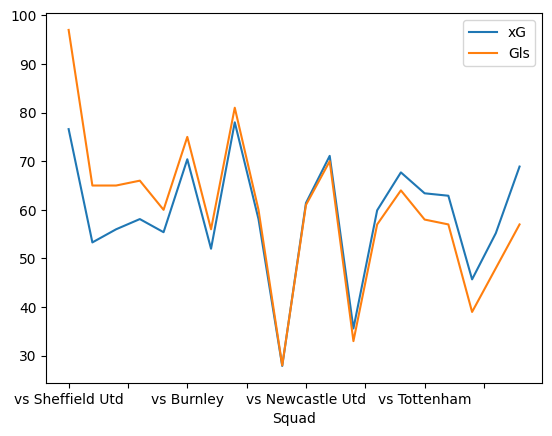

In [122]:
line_chart(df_dat_23)

<Axes: ylabel='Squad'>

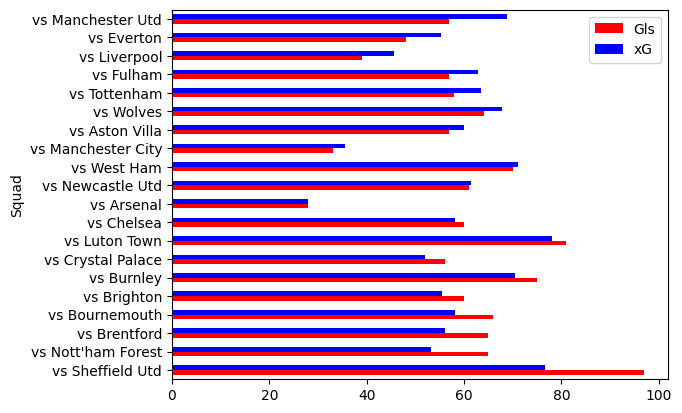

In [123]:
bar_chart_h(df_dat_23)

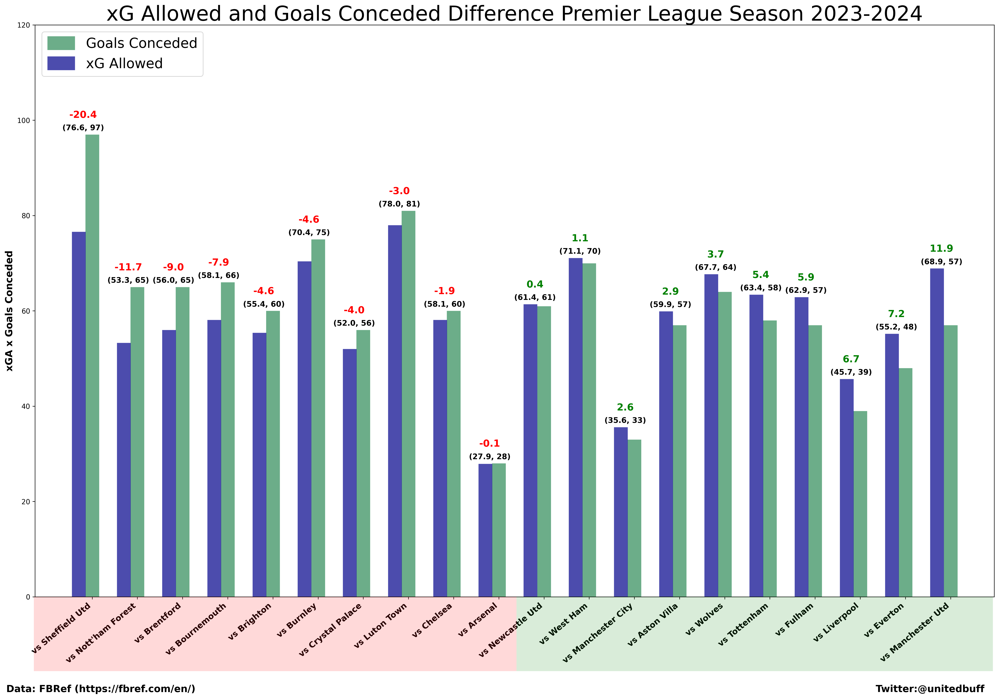

In [139]:
green_start = .514
green_width = .385
red_width = .390
season = "2023-2024"
visualization(df_dat_23,green_start,green_width,red_width, season)

### Prem 2024

In [140]:
df_dat_24 = preprocess_xga(df_2024)
df_dat_24

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,xG-G
0,vs Wolves,30,27.1,52.7,35,385,3150,35.0,59,42,...,8,81,3,53.5,47.2,37.9,85.1,705,1441,-5.5
1,vs Leicester City,31,27.1,54.5,35,385,3150,35.0,73,53,...,4,55,2,67.6,64.5,49.0,113.6,675,1624,-5.4
2,vs Brighton,31,27.0,47.7,35,385,3150,35.0,54,37,...,8,89,5,49.4,43.3,37.2,80.5,548,1117,-4.6
3,vs Ipswich Town,32,27.0,60.0,35,385,3150,35.0,74,49,...,6,59,2,69.4,65.1,51.0,116.1,772,1622,-4.6
4,vs Fulham,26,27.0,47.8,35,385,3150,35.0,45,36,...,2,63,3,40.6,39.0,30.9,69.9,587,1272,-4.4
5,vs Southampton,35,27.0,50.6,35,385,3150,35.0,82,58,...,9,53,1,78.1,71.2,57.2,128.3,736,1458,-3.9
6,vs Aston Villa,28,27.2,49.0,35,385,3150,35.0,49,35,...,2,96,2,45.9,44.3,33.9,78.2,619,1174,-3.1
7,vs West Ham,27,27.0,52.1,35,385,3150,35.0,56,43,...,3,52,1,54.9,52.6,44.4,97.0,773,1498,-1.1
8,vs Arsenal,25,26.9,43.0,35,385,3150,35.0,31,21,...,3,79,2,29.9,27.5,20.9,48.5,558,852,-1.1
9,vs Liverpool,24,26.9,42.0,35,385,3150,35.0,33,24,...,2,80,1,32.0,30.3,24.5,54.9,606,983,-1.0


<Axes: xlabel='Squad'>

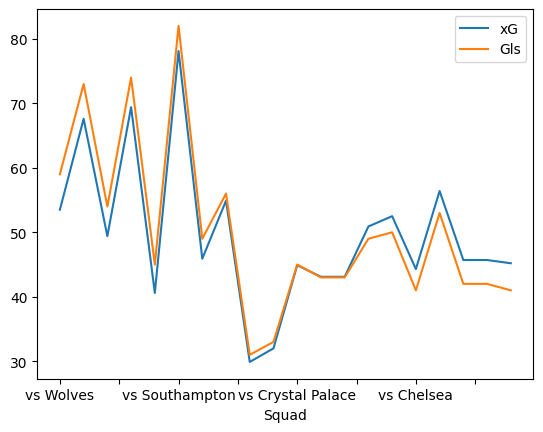

In [141]:
line_chart(df_dat_24)

<Axes: ylabel='Squad'>

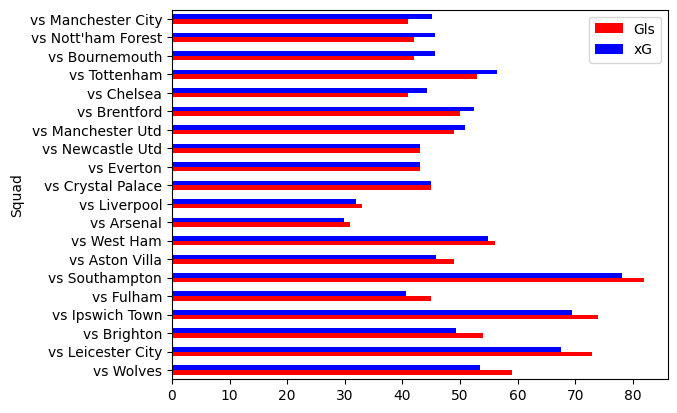

In [142]:
bar_chart_h(df_dat_24)

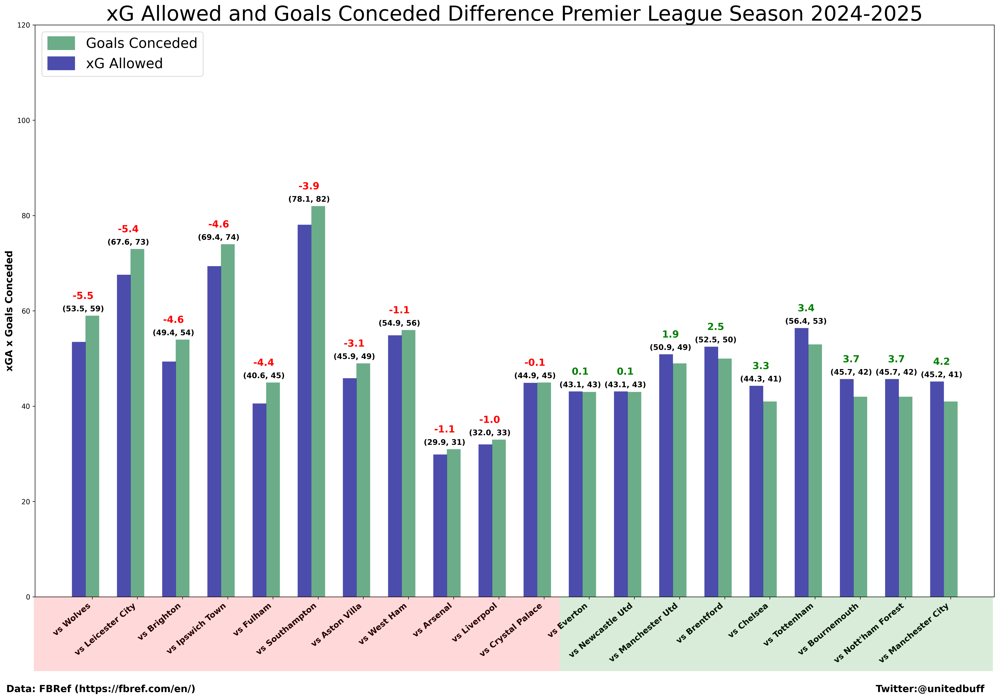

In [156]:
green_start = .549
green_width = .35
red_width = .425
season = "2024-2025"
visualization(df_dat_24,green_start,green_width,red_width, season)

# xG vs xG Allowed

In [157]:
df_standing_2022 = pd.read_html('https://fbref.com/en/comps/9/2022-2023/2022-2023-Premier-League-Stats')
df_standing_2023 = pd.read_html('https://fbref.com/en/comps/9/2023-2024/2023-2024-Premier-League-Stats')
df_standing_2024 = pd.read_html('https://fbref.com/en/comps/9/Premier-League-Stats')

In [158]:
df_standing_2022

[    Rk            Squad  MP   W   D   L  GF  GA  GD  Pts  Pts/MP    xG   xGA  \
 0    1  Manchester City  38  28   5   5  94  33  61   89    2.34  78.6  32.1   
 1    2          Arsenal  38  26   6   6  88  43  45   84    2.21  71.6  42.0   
 2    3   Manchester Utd  38  23   6   9  58  43  15   75    1.97  67.7  50.4   
 3    4    Newcastle Utd  38  19  14   5  68  33  35   71    1.87  71.9  39.5   
 4    5        Liverpool  38  19  10   9  75  47  28   67    1.76  71.5  50.8   
 5    6         Brighton  38  18   8  12  72  53  19   62    1.63  73.3  50.2   
 6    7      Aston Villa  38  18   7  13  51  46   5   61    1.61  50.3  52.5   
 7    8        Tottenham  38  18   6  14  70  63   7   60    1.58  57.0  49.6   
 8    9        Brentford  38  15  14   9  58  46  12   59    1.55  56.3  48.8   
 9   10           Fulham  38  15   7  16  55  53   2   52    1.37  46.2  63.6   
 10  11   Crystal Palace  38  11  12  15  40  49  -9   45    1.18  39.3  48.1   
 11  12          Chelsea  38

### Function

In [ ]:
def preprocess_xga(df):
    df = pd.DataFrame(df[1])
    df.columns = df.columns.droplevel()
    df = df.iloc[:,0:22]
    df['xG-G'] = df.xG-df.Gls
    df = df.sort_values('xG-G',ascending=True).reset_index(drop=True)
    return df


def line_chart(df):
    return df.plot.line(x='Squad',y=['xG','Gls'])

def bar_chart_h(df):
    return df.plot.barh(x='Squad',y=['Gls','xG'],color={"Gls":"Red","xG":"Blue"})

def visualization(df,green_start,green_width,red_width, season):
    df = df.sort_values('xG-G',ascending=True).reset_index(drop=True)
    viz_dat = df[['Squad','xG','Gls','xG-G']]
    # Draw plot
    import matplotlib.patches as patches

    fig, ax = plt.subplots(figsize=(25,15), facecolor='white', dpi= 300)

    x=viz_dat.index
    w = 0.3
    ax.vlines(x=x, ymin=0, ymax=viz_dat.Gls, color='seagreen', alpha=0.7, linewidth=20,label="Goals Conceded")
    ax.vlines(x=x-w, ymin=0, ymax=viz_dat.xG, color='darkblue', alpha=0.7, linewidth=20,label="xG Allowed")
    #ax.bar(x-w,viz_dat.xG,width=w,color='green',align='center')
    #ax.bar(x,viz_dat.Gls,width=w,color='firebrick',align='center')
    ax.legend(loc="upper left",fontsize="20")

    # Annotate Text
    for i, a in enumerate(viz_dat.xG):
        if a>viz_dat['Gls'][i]:
            ax.text(i-0.2, a+3.5, round(viz_dat['xG-G'][i],1), horizontalalignment='center', fontdict={'size':14,'fontweight':'bold','color':'green'})
            ax.text(i-0.2, a+0.9, (viz_dat['xG'][i],viz_dat['Gls'][i]), horizontalalignment='center',fontdict={'size':11,'fontweight':'bold'})
        else:
            ax.text(i-0.2, viz_dat['Gls'][i]+3.5, round(viz_dat['xG-G'][i],1), horizontalalignment='center',fontdict={'size':14,'fontweight':'bold','color':'red'})
            ax.text(i-0.2, viz_dat['Gls'][i]+0.9, (viz_dat['xG'][i],viz_dat['Gls'][i]), horizontalalignment='center',fontdict={'size':11,'fontweight':'bold'})

    # Title, Label, Ticks and Ylim
    ax.set_title(f'xG Allowed and Goals Conceded Difference Premier League Season {season}', fontdict={'size':30})
    ax.set(ylim=(0,120))
    ax.set_ylabel('xGA x Goals Conceded',fontsize=14,fontweight='bold')
    plt.xticks(viz_dat.index, viz_dat.Squad, rotation=40, horizontalalignment='right', fontsize=12,fontweight='bold')
    ax.text(-.03, -.17, 'Data: FBRef (https://fbref.com/en/)', ha='left', va='bottom', transform=ax.transAxes,fontdict={'size':14,'fontweight':'bold','color':'black'})
    ax.text(.99, -.17, 'Twitter:@unitedbuff', ha='right', va='bottom', transform=ax.transAxes,fontdict={'size':14,'fontweight':'bold','color':'black'})
    # Add patches to color the X axis labels
    p1 = patches.Rectangle((green_start, 0.01), width=green_width, height=.10, alpha=.15, facecolor='green', transform=fig.transFigure)
    p2 = patches.Rectangle((.124, 0.01), width=red_width, height=.10, alpha=.15, facecolor='red', transform=fig.transFigure)
    fig.add_artist(p1)
    fig.add_artist(p2)
    #plt.grid()
    plt.show()

### Prem 2022

In [ ]:
df_dat_22 = preprocess_xga(df_2022)
df_dat_22

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,xG-G
0,vs Tottenham,29,26.7,50.1,38,418,3420,38.0,62,45,...,4,79,2,49.6,46.5,36.3,82.8,685,1516,-12.4
1,vs Leeds United,29,26.7,53.1,38,418,3420,38.0,77,50,...,6,66,3,67.1,62.4,49.8,112.2,596,1469,-9.9
2,vs Southampton,36,26.7,55.6,38,418,3420,38.0,68,55,...,3,63,2,60.8,58.4,46.2,104.6,653,1735,-7.2
3,vs Bournemouth,31,26.6,59.9,38,418,3420,38.0,68,49,...,7,51,0,63.8,58.3,45.3,103.6,810,1988,-4.2
4,vs Nott'ham Forest,33,26.8,62.8,38,418,3420,38.0,68,45,...,9,65,0,64.2,57.5,45.0,102.5,813,1904,-3.8
5,vs West Ham,25,26.6,58.2,38,418,3420,38.0,54,42,...,6,54,0,53.0,48.4,39.8,88.2,805,1721,-1.0
6,vs Arsenal,26,26.7,40.1,38,418,3420,38.0,42,27,...,5,84,1,42.0,38.0,31.6,69.6,510,907,0.0
7,vs Manchester City,24,26.6,34.7,38,418,3420,38.0,32,21,...,3,80,2,32.1,29.8,23.8,53.5,434,860,0.1
8,vs Leicester City,28,26.6,52.4,38,418,3420,38.0,63,46,...,5,64,2,63.3,59.8,47.9,107.7,721,1575,0.3
9,vs Crystal Palace,26,26.6,53.9,38,418,3420,38.0,46,32,...,4,83,3,48.1,44.9,34.5,79.4,590,1592,2.1


<Axes: xlabel='Squad'>

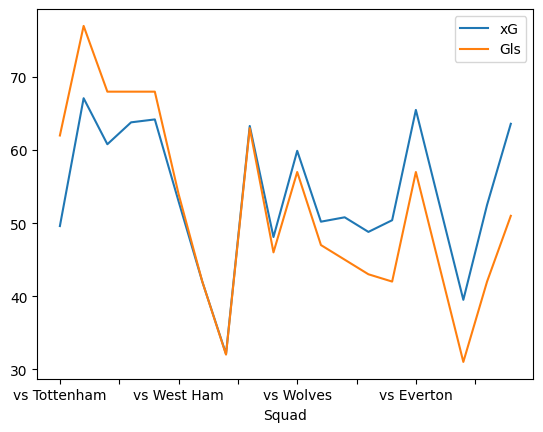

In [ ]:
line_chart(df_dat_22)

<Axes: ylabel='Squad'>

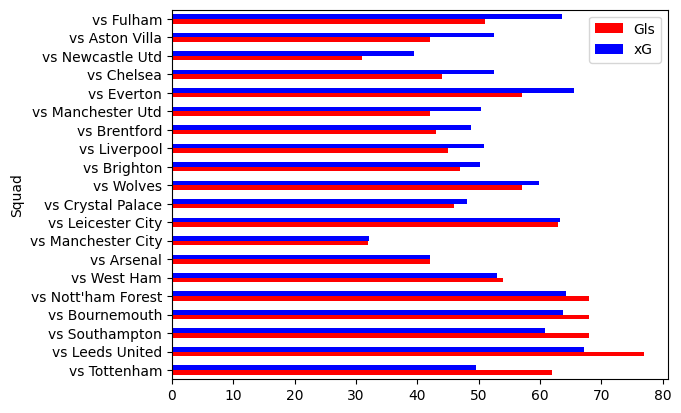

In [ ]:
bar_chart_h(df_dat_22)

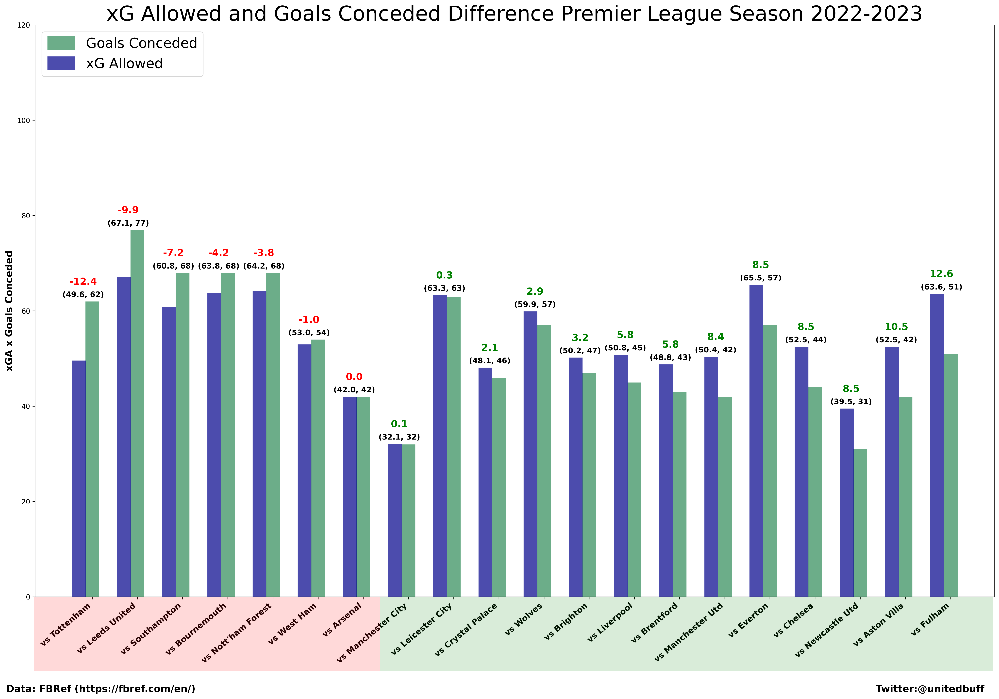

In [ ]:
green_start = .404
green_width = .495
red_width = .280
season = "2022-2023"
visualization(df_dat_22, green_start, green_width, red_width, season)

### Prem 2023

In [ ]:
df_dat_23 = preprocess_xga(df_2023)
df_dat_23

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,xG-G
0,vs Sheffield Utd,35,26.4,64.2,38,418,3420,38.0,97,75,...,7,53,2,76.6,71.2,57.0,128.2,964,1975,-20.4
1,vs Nott'ham Forest,33,26.4,59.4,38,418,3420,38.0,65,48,...,4,81,7,53.3,50.1,37.1,87.2,815,1901,-11.7
2,vs Brentford,28,26.1,54.8,38,418,3420,38.0,65,50,...,2,75,4,56.0,54.4,43.6,98.0,847,1585,-9.0
3,vs Bournemouth,30,26.2,55.6,38,418,3420,38.0,66,44,...,7,82,2,58.1,52.5,39.9,92.4,720,1500,-7.9
4,vs Brighton,30,26.3,40.2,38,418,3420,38.0,60,42,...,6,99,5,55.4,50.7,39.3,90.0,651,1175,-4.6
5,vs Burnley,31,26.3,52.6,38,418,3420,38.0,75,54,...,7,84,3,70.4,64.9,52.0,116.9,711,1501,-4.6
6,vs Crystal Palace,26,26.3,57.7,38,418,3420,38.0,56,46,...,3,78,2,52.0,49.6,40.3,89.9,679,1713,-4.0
7,vs Luton Town,28,26.5,57.6,38,418,3420,38.0,81,57,...,4,73,2,78.0,74.9,56.8,131.7,723,1495,-3.0
8,vs Chelsea,32,26.3,41.4,38,418,3420,38.0,60,43,...,5,100,4,58.1,54.1,42.0,96.1,727,1368,-1.9
9,vs Arsenal,25,26.3,41.8,38,418,3420,38.0,28,20,...,3,82,2,27.9,25.7,19.9,45.6,534,938,-0.1


<Axes: xlabel='Squad'>

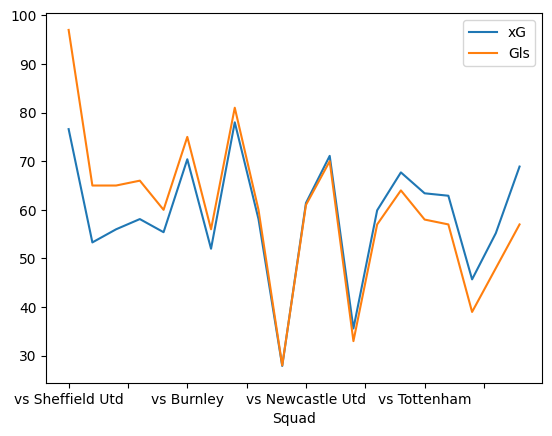

In [ ]:
line_chart(df_dat_23)

<Axes: ylabel='Squad'>

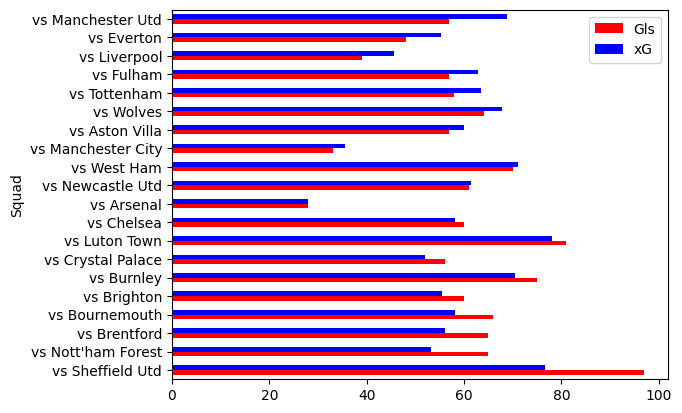

In [ ]:
bar_chart_h(df_dat_23)

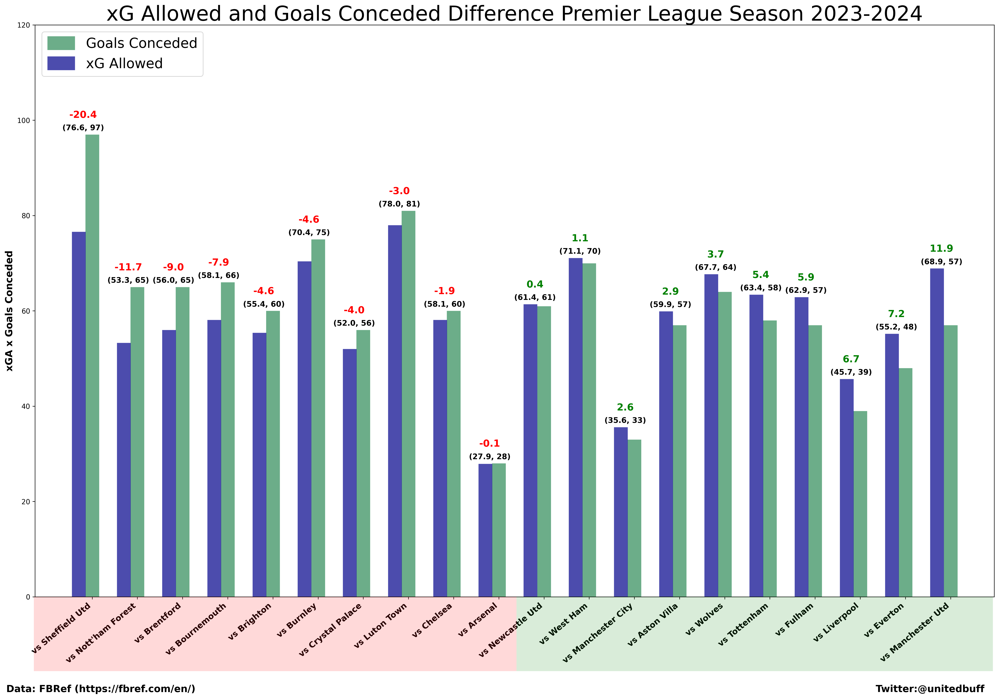

In [ ]:
green_start = .514
green_width = .385
red_width = .390
season = "2023-2024"
visualization(df_dat_23,green_start,green_width,red_width, season)

### Prem 2024

In [ ]:
df_dat_24 = preprocess_xga(df_2024)
df_dat_24

,Squad,# Pl,Age,Poss,MP,Starts,Min,90s,Gls,Ast,...,PKatt,CrdY,CrdR,xG,npxG,xAG,npxG+xAG,PrgC,PrgP,xG-G
0,vs Wolves,30,27.1,52.7,35,385,3150,35.0,59,42,...,8,81,3,53.5,47.2,37.9,85.1,705,1441,-5.5
1,vs Leicester City,31,27.1,54.5,35,385,3150,35.0,73,53,...,4,55,2,67.6,64.5,49.0,113.6,675,1624,-5.4
2,vs Brighton,31,27.0,47.7,35,385,3150,35.0,54,37,...,8,89,5,49.4,43.3,37.2,80.5,548,1117,-4.6
3,vs Ipswich Town,32,27.0,60.0,35,385,3150,35.0,74,49,...,6,59,2,69.4,65.1,51.0,116.1,772,1622,-4.6
4,vs Fulham,26,27.0,47.8,35,385,3150,35.0,45,36,...,2,63,3,40.6,39.0,30.9,69.9,587,1272,-4.4
5,vs Southampton,35,27.0,50.6,35,385,3150,35.0,82,58,...,9,53,1,78.1,71.2,57.2,128.3,736,1458,-3.9
6,vs Aston Villa,28,27.2,49.0,35,385,3150,35.0,49,35,...,2,96,2,45.9,44.3,33.9,78.2,619,1174,-3.1
7,vs West Ham,27,27.0,52.1,35,385,3150,35.0,56,43,...,3,52,1,54.9,52.6,44.4,97.0,773,1498,-1.1
8,vs Arsenal,25,26.9,43.0,35,385,3150,35.0,31,21,...,3,79,2,29.9,27.5,20.9,48.5,558,852,-1.1
9,vs Liverpool,24,26.9,42.0,35,385,3150,35.0,33,24,...,2,80,1,32.0,30.3,24.5,54.9,606,983,-1.0


<Axes: xlabel='Squad'>

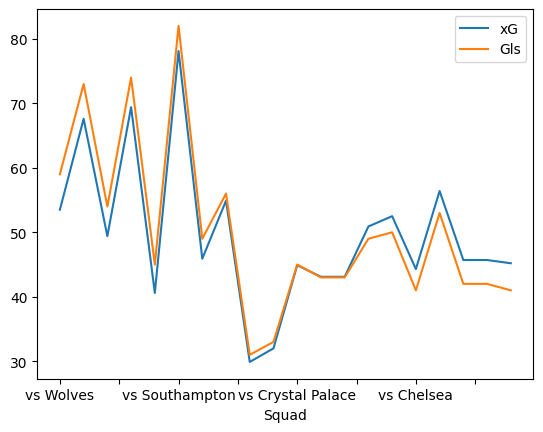

In [ ]:
line_chart(df_dat_24)

<Axes: ylabel='Squad'>

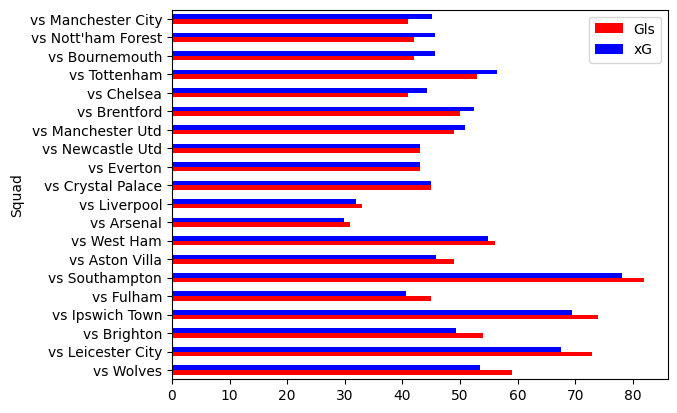

In [ ]:
bar_chart_h(df_dat_24)

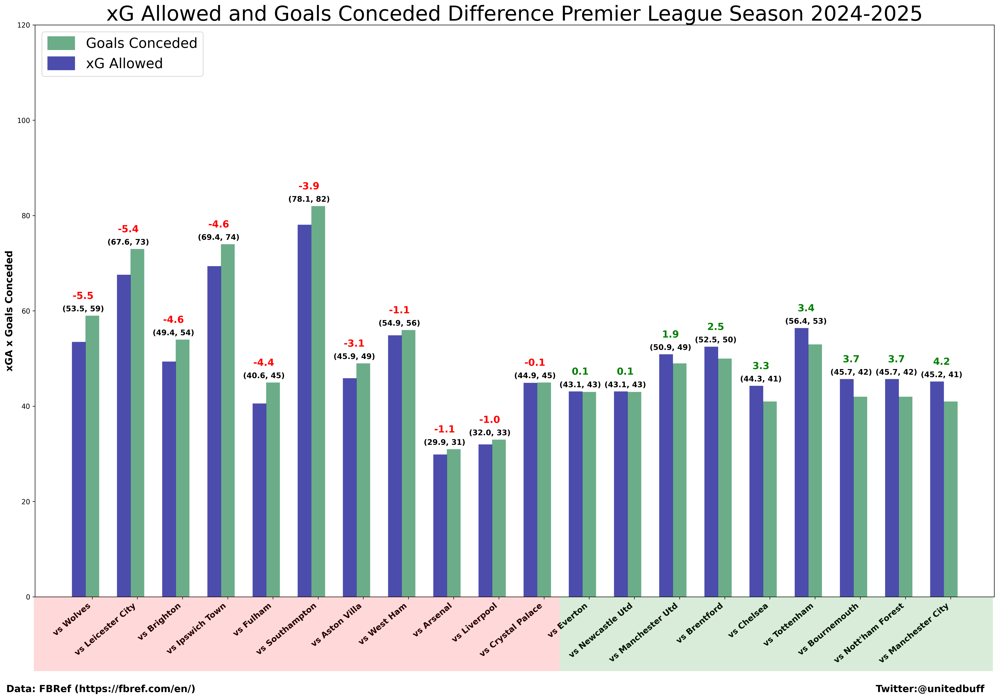

In [ ]:
green_start = .549
green_width = .35
red_width = .425
season = "2024-2025"
visualization(df_dat_24,green_start,green_width,red_width, season)